In [28]:
!pip install deepface

In [29]:
from deepface import DeepFace

In [30]:
import os
import cv2
import glob
import fnmatch
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [31]:
path = '/content/drive/MyDrive/PersianFace'

dir_list = os.listdir(path)
print(dir_list)

['Bahram_Radan', 'Ehsan_Alikhani', 'Behnam_Bani', 'Asghar_Farhadi', 'Ebi', 'Bahare_Rahnama', 'Ali_Khamenei', 'Ali_Daei', 'Dariush_Arjmand', 'Adel_FerdowsiPour', 'Golshifteh_Farahani', 'Elham_Hamidi', 'Elnaz_Shakerdoost', 'Leyla_Hatami', 'Mehran_Ghafourian', 'Mahnaz_Afshar', 'Javad_Khiabani', 'Javad_Razavian', 'Hootan_Shakiba', 'Hamid_Lolaei', 'Mohsen_Chavoshi', 'Parinaz_Izadyar', 'Parsa_Pirozfar', 'Parviz_Parastooee', 'Siamak_Ansari', 'Tannaz_Tabatabaee', 'Shahab_Hosseini', 'Siavash_Ghomayshi', 'Mehran_Modiri', 'Taraneh_Alidoosti']


In [32]:
for celebrity in dir_list :
  print(celebrity)

Bahram_Radan
Ehsan_Alikhani
Behnam_Bani
Asghar_Farhadi
Ebi
Bahare_Rahnama
Ali_Khamenei
Ali_Daei
Dariush_Arjmand
Adel_FerdowsiPour
Golshifteh_Farahani
Elham_Hamidi
Elnaz_Shakerdoost
Leyla_Hatami
Mehran_Ghafourian
Mahnaz_Afshar
Javad_Khiabani
Javad_Razavian
Hootan_Shakiba
Hamid_Lolaei
Mohsen_Chavoshi
Parinaz_Izadyar
Parsa_Pirozfar
Parviz_Parastooee
Siamak_Ansari
Tannaz_Tabatabaee
Shahab_Hosseini
Siavash_Ghomayshi
Mehran_Modiri
Taraneh_Alidoosti


In [33]:
def generate_dataset(img_path , celebrity , count) :
  embedding_objs = DeepFace.represent(img_path= img_path , model_name="ArcFace", enforce_detection=False)
  embedding = embedding_objs[0]["embedding"]
  embedding.append(celebrity)
  embedding.append(count)
  print(embedding)
  return np.array(embedding , dtype=object)




In [34]:
columns=[]

for count in range(512):
  columns.append('feature' + str(count))

columns.append('label')
columns.append('label_count')
print(columns)



['feature0', 'feature1', 'feature2', 'feature3', 'feature4', 'feature5', 'feature6', 'feature7', 'feature8', 'feature9', 'feature10', 'feature11', 'feature12', 'feature13', 'feature14', 'feature15', 'feature16', 'feature17', 'feature18', 'feature19', 'feature20', 'feature21', 'feature22', 'feature23', 'feature24', 'feature25', 'feature26', 'feature27', 'feature28', 'feature29', 'feature30', 'feature31', 'feature32', 'feature33', 'feature34', 'feature35', 'feature36', 'feature37', 'feature38', 'feature39', 'feature40', 'feature41', 'feature42', 'feature43', 'feature44', 'feature45', 'feature46', 'feature47', 'feature48', 'feature49', 'feature50', 'feature51', 'feature52', 'feature53', 'feature54', 'feature55', 'feature56', 'feature57', 'feature58', 'feature59', 'feature60', 'feature61', 'feature62', 'feature63', 'feature64', 'feature65', 'feature66', 'feature67', 'feature68', 'feature69', 'feature70', 'feature71', 'feature72', 'feature73', 'feature74', 'feature75', 'feature76', 'feature

In [35]:
Data = []
count = -1
for celebrity in dir_list :
  print(celebrity)
  dir_image = '/content/drive/MyDrive/PersianFace/' + celebrity
  data_path = os.path.join(dir_image, '*g')
  files = glob.glob(data_path)
  count += 1
  for File in files:
    data = generate_dataset(File , celebrity , count)
    Data.append(data)
  print(Data)


Streaming output truncated to the last 5000 lines.
       0.24447330832481384, -0.33173710107803345, -0.07726006209850311,
       0.10154193639755249, -0.1282457560300827, 0.03898560255765915,
       0.049572281539440155, 0.04922012239694595, 0.21936537325382233,
       0.10076965391635895, -0.06579765677452087, -0.4008339047431946,
       0.03000963106751442, 0.14529284834861755, 0.06412537395954132,
       -0.03946014121174812, 0.27720552682876587, -0.16643598675727844,
       0.05994968116283417, 0.6698810458183289, 0.15839746594429016,
       -0.14599139988422394, -0.1368458867073059, 0.18664924800395966,
       -0.06641547381877899, -0.1305610090494156, 0.14345619082450867,
       -0.011697687208652496, -0.021136008203029633, 0.10213334858417511,
       -0.15963363647460938, 0.022830015048384666, 0.17794282734394073,
       0.2985168695449829, -0.04828106611967087, 0.1163775697350502,
       0.1221216470003128, 0.375335156917572, 0.4260669946670532,
       -0.04364172741770744, -0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0034722276031970978, 0.004338008351624012, 0.2352735847234726, -0.14175403118133545, -0.1637306958436966, 0.09075417369604111, 0.017426449805498123, 0.20575501024723053, 0.04566749185323715, -0.009622134268283844, -0.2010306417942047, 0.0476682223379612, -0.028284180909395218, 0.022103870287537575, 0.1834416389465332, 0.007623536512255669, 0.15814656019210815, 0.1420372575521469, 0.11945908516645432, -0.007243841886520386, 0.16391122341156006, -0.061329904943704605, -0.017270054668188095, -0.06098415330052376, 0.029118621721863747, -0.14395631849765778, -0.05159832164645195, 0.2352057695388794, -0.07744897902011871, 0.0478193536400795, -0.07232002168893814, 0.13272929191589355, 0.02748902142047882, 0.26366764307022095, 0.1296195238828659, 0.06848238408565521, -0.20995858311653137, 0.08913207054138184, 0.08653084188699722, -0.0032875649631023407, 0.2559066712856293, -0.04484361782670021, 0.08345196396112442, -0.01428345125168562, 0.0035328143276274204, 0.011670868843793869, 0.0182492

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.2838267683982849, 0.08429920673370361, 0.0072783734649419785, -0.3082652986049652, -0.07508759200572968, 0.1552889496088028, 0.15800662338733673, 0.11065860092639923, -0.17179471254348755, -0.1365208923816681, 0.18227770924568176, -0.2647729218006134, -0.08700072765350342, 0.08707507699728012, -0.06785912811756134, -0.29167410731315613, 0.2049570232629776, 0.35443028807640076, 0.1899685114622116, -0.08521100133657455, -0.2912442684173584, 0.07889332622289658, -0.08856987953186035, -0.1337960660457611, -0.06921027600765228, -0.06805973500013351, 0.26603269577026367, 0.17069770395755768, -0.4922833740711212, 0.17640775442123413, -0.004152193665504456, 0.032775670289993286, -0.1617353856563568, 0.07597541064023972, 0.021197734400629997, -0.42923736572265625, 0.04261863976716995, -0.11614356935024261, -0.04221248999238014, -0.016657095402479172, -0.053925879299640656, 0.04844048246741295, -0.3124033212661743, 0.15505194664001465, -0.07839193195104599, -0.09824074804782867, -0.087455466

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.15703468024730682, 0.4726404547691345, -0.07164915651082993, -0.3811584711074829, 0.031682319939136505, 0.19693061709403992, -0.05525468289852142, -0.07426860928535461, -0.0009800568222999573, -0.058581460267305374, 0.12331198900938034, 0.10081388056278229, -0.16692298650741577, 0.09352441132068634, 0.013665648177266121, -0.3459353446960449, 0.1629609614610672, 0.12833133339881897, -0.40247833728790283, -0.33198049664497375, -0.29960155487060547, 0.1883517950773239, 0.41356536746025085, -0.0813882127404213, -0.060084350407123566, -0.1673831343650818, 0.14107470214366913, 0.44398900866508484, -0.16587063670158386, -0.21218091249465942, -0.7035817503929138, 0.26274818181991577, -0.5012435913085938, 0.47848954796791077, -0.13098765909671783, 0.009385604411363602, 0.02514321357011795, -0.003756443038582802, 0.10109364986419678, -0.23560020327568054, 0.4755558967590332, -0.1678498387336731, -0.5263570547103882, -0.15677958726882935, -0.4454055726528168, 0.4676281213760376, 0.12040740251

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.09471575170755386, 0.2965525686740875, -0.058459874242544174, -0.036193348467350006, -0.2532646358013153, 0.03177708387374878, -0.06992657482624054, -0.2648995518684387, -0.17762279510498047, 0.17766906321048737, -0.015389909967780113, 0.32605937123298645, 0.021701082587242126, -0.0042883120477199554, 0.2295295000076294, 0.15776371955871582, -0.04001133143901825, -0.2113201767206192, 0.07535936683416367, 0.2536178231239319, 0.4178864657878876, 0.012501382268965244, -0.011188837699592113, -0.14721781015396118, -0.0834045484662056, -0.10753349959850311, -0.32274067401885986, 0.4046301543712616, -0.27175039052963257, 0.14723682403564453, 0.09567905217409134, 0.061468999832868576, -0.02005027048289776, 0.1374131143093109, 0.15938356518745422, 0.011520421132445335, 0.23221272230148315, -0.07460777461528778, 0.20424124598503113, 0.26969805359840393, -0.271350622177124, 0.21295829117298126, -0.46644145250320435, 0.11375272274017334, -0.2705080807209015, 0.23400992155075073, 0.2428480982780

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.12723298370838165, -0.05850067734718323, -0.229853093624115, -0.06621503829956055, -0.1500837504863739, -0.01235265750437975, 0.11353114992380142, -0.15413041412830353, -0.29159241914749146, 0.005691584199666977, -0.06985245645046234, 0.10508232563734055, -0.3440299332141876, -0.07077859342098236, 0.25129005312919617, 0.08079619705677032, 0.14453007280826569, -0.07421152293682098, 0.0645361989736557, 0.08183322101831436, 0.22797644138336182, 0.04463234543800354, -0.1661325991153717, 0.0903945192694664, 0.027614541351795197, -0.22223679721355438, -0.268435001373291, 0.23050905764102936, 0.28953811526298523, -0.022964881733059883, 0.019561566412448883, 0.00862775556743145, 0.060328878462314606, 0.08237435668706894, 0.021107995882630348, 0.2843237817287445, -0.017337322235107422, -0.08153697848320007, 0.15903398394584656, 0.12012327462434769, 0.04617272689938545, 0.15117472410202026, -0.09044180810451508, -0.13683553040027618, 0.28411632776260376, 0.06489677727222443, 0.06735385209321

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.009296359494328499, 0.09531106054782867, -0.013561133295297623, -0.14095550775527954, -0.04091838002204895, -0.16097982227802277, 0.14343780279159546, 0.06179341301321983, -0.13632984459400177, -0.05298566073179245, -0.21838417649269104, -0.04768482968211174, -6.180256605148315e-05, -0.17156054079532623, -0.10159561038017273, 0.12300734966993332, 0.049215853214263916, -0.17642240226268768, 0.025293467566370964, -0.39685508608818054, 0.12199447304010391, 0.09727922081947327, 0.0668078362941742, -0.0376773476600647, 0.06874208152294159, 0.029667392373085022, -0.3129662573337555, 0.1458151638507843, -0.06804332137107849, -0.4999454915523529, -0.09814300388097763, 0.0526011623442173, 0.015227239578962326, 0.0911259576678276, -0.03318663686513901, 0.09427624940872192, -0.07068158686161041, 0.17526429891586304, 0.018919313326478004, 0.19018109142780304, 0.34920021891593933, -0.0012796982191503048, -0.27886641025543213, -0.2752951681613922, -0.44024819135665894, -0.13646459579467773, 0.08

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.3239164650440216, 0.8388174176216125, -0.18485848605632782, -0.6018438935279846, -0.04687817394733429, 0.46811020374298096, -0.23463772237300873, -0.23803402483463287, 0.13927531242370605, -0.07395260781049728, 0.36287856101989746, 0.17509375512599945, -0.4110398292541504, 0.17304952442646027, 0.06235150992870331, -0.7840045690536499, 0.23643383383750916, 0.10036821663379669, -0.7537747025489807, -0.7122446894645691, -0.6931860446929932, 0.33141395449638367, 0.7605061531066895, -0.011100593023002148, 0.05089130252599716, -0.3737146258354187, 0.229340061545372, 0.8073601126670837, -0.08188630640506744, -0.42238032817840576, -1.4799655675888062, 0.5096706748008728, -0.9307863712310791, 0.9875648021697998, -0.2716493606567383, 0.11543507874011993, 0.019075723364949226, -0.14004039764404297, 0.12670190632343292, -0.5500901341438293, 0.8454366326332092, -0.3638175427913666, -1.0433233976364136, -0.30130791664123535, -0.9473116993904114, 0.8456934094429016, 0.07938084006309509, 0.8314900

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.08958663046360016, 0.3080967664718628, -0.12949655950069427, -0.08397367596626282, -0.2527914345264435, 0.04181113839149475, 0.1404935121536255, 0.05487604811787605, 0.17557328939437866, -0.34063997864723206, -0.05449026823043823, -0.17527061700820923, -0.4557141065597534, 0.1002923771739006, 0.11296718567609787, -0.2104680985212326, 0.02857183665037155, 0.08712701499462128, -0.0890466719865799, -0.15916351974010468, -0.32274824380874634, 0.21012932062149048, -0.15498599410057068, -0.021884599700570107, -0.24279610812664032, -0.07081574946641922, 0.13422374427318573, -0.04205235093832016, -0.36900168657302856, 0.3635692894458771, 0.029017336666584015, -0.002324244938790798, 0.116386778652668, 0.20687620341777802, -0.09171894192695618, -0.1663435697555542, 0.1378156840801239, -0.2735429108142853, -0.09915906935930252, -0.056750837713479996, 0.02002306468784809, 0.027937032282352448, -0.159751757979393, -0.33277079463005066, -0.20570462942123413, 0.08527940511703491, -0.2867285907268

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.03744696453213692, 0.14368094503879547, -0.03918581083416939, 0.17947614192962646, 0.09409734606742859, 0.10920872539281845, 0.19897522032260895, 0.12295550107955933, -0.057985931634902954, -0.07583203911781311, 0.10241534560918808, -0.05360502004623413, -0.3243873119354248, 0.11654157936573029, -0.09839174151420593, 0.009032018482685089, 0.08121777325868607, 0.00899591576308012, 0.020938539877533913, -0.4532536268234253, 0.3419308364391327, -0.04566652700304985, 0.18752002716064453, -0.0010523460805416107, -0.03352124243974686, -0.3211204409599304, -0.08371611684560776, -0.31088149547576904, -0.3852537274360657, 0.21843579411506653, -0.11366214603185654, 0.2218054085969925, 0.06053770333528519, 0.07830491662025452, 0.2928498387336731, -0.10744765400886536, 0.2361447811126709, -0.06561890244483948, -0.15928108990192413, -0.011496462859213352, 0.07543781399726868, 0.012376269325613976, -0.2403545081615448, 0.022519510239362717, -0.4244194030761719, -0.05142410099506378, -0.018885450

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.05918177589774132, -0.06769556552171707, 0.0770164206624031, 0.014690641313791275, 0.21512800455093384, 0.2270011603832245, 0.021883781999349594, -0.11291158199310303, 0.03195437788963318, 0.004794060252606869, -0.05072880536317825, -0.05349806696176529, -0.18281173706054688, -0.1601356714963913, -0.40512552857398987, 0.05825738608837128, 0.037996768951416016, 0.14524376392364502, -0.0949549525976181, -0.014990722760558128, 0.027213428169488907, 0.014246300794184208, 0.14652171730995178, -0.12325819581747055, 0.16266468167304993, -0.02406923472881317, -0.10797254741191864, 0.1184304729104042, -0.17031320929527283, 0.04516439512372017, -0.06915964186191559, -0.01411875057965517, 0.19346216320991516, -0.21478457748889923, -0.11906424164772034, -0.2750750482082367, 0.16942721605300903, 0.020317934453487396, -0.22554802894592285, 0.016642514616250992, 0.0741897001862526, -0.04784990847110748, -0.14801807701587677, 0.21474286913871765, 0.15864023566246033, -0.1916547268629074, -0.112989

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.05666166543960571, 0.10987970978021622, -0.014968658797442913, -0.03891165181994438, 0.029573490843176842, 0.0755741149187088, 0.010334841907024384, 0.06971782445907593, 0.1657460331916809, -0.10200350731611252, 0.10165969282388687, 0.031613390892744064, -0.0992162749171257, 0.13131102919578552, 0.35157307982444763, 0.09504327178001404, 0.03976898267865181, 0.02342488244175911, -0.09014862030744553, 0.198235884308815, 0.13689714670181274, -0.11520225554704666, -0.09852132946252823, -0.04039769619703293, -0.1416378617286682, -0.1259269118309021, -0.026037389412522316, -0.08359093219041824, -0.30946671962738037, -0.040836401283741, -0.3547394275665283, -0.17723308503627777, 0.12097757309675217, 0.15541550517082214, -0.01145980041474104, -0.31014904379844666, 0.11401256173849106, 0.01833757385611534, 0.11375151574611664, -0.014035806991159916, -0.011799264699220657, -0.022011199966073036, -0.2508491277694702, -0.046325407922267914, -0.3312062621116638, -0.12386739253997803, 0.125671535

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.002603384666144848, 0.122946597635746, 0.007286520674824715, -0.16701504588127136, -0.037627801299095154, 0.07643118500709534, -0.06884744763374329, 0.1223355382680893, 0.5264984369277954, 0.17610105872154236, -0.030580613762140274, 0.12142140418291092, -0.2570909261703491, 0.040893808007240295, -0.1246233582496643, 0.36224061250686646, -0.017665967345237732, 0.12609907984733582, 0.18590733408927917, -0.1522006094455719, -0.02200530469417572, 0.16711434721946716, 0.03339357301592827, -0.0004955166950821877, -0.01566442847251892, -0.1542830765247345, -0.3021792769432068, 0.2360389083623886, -0.1579880565404892, -0.06673340499401093, 0.119240902364254, 0.14107054471969604, -0.2722223401069641, 0.5179692506790161, 0.05020102113485336, 0.22821851074695587, 0.35796624422073364, 0.1354903280735016, 0.12271974980831146, 0.07364173978567123, -0.1350184977054596, -0.14459678530693054, -0.15690471231937408, -0.05193142965435982, -0.016077537089586258, -0.3022953271865845, -0.0404462441802024

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.06548485904932022, 0.4471670091152191, 0.08455204218626022, -0.10091248899698257, -0.1544293910264969, -0.14816942811012268, -0.05682554841041565, -0.260032594203949, 0.31858888268470764, -0.18718162178993225, 0.12704336643218994, -0.3009781539440155, 0.07323994487524033, -0.23355701565742493, -0.05974840745329857, 0.26147177815437317, -0.1884295642375946, -0.08157713711261749, 0.19410093128681183, -0.08314768224954605, 0.1839906871318817, -0.13575533032417297, -0.3053781986236572, -0.07216636836528778, 0.11415045708417892, 0.16958169639110565, -0.12117962539196014, 0.32107487320899963, 0.16754068434238434, -0.1967078149318695, -0.01944991573691368, 0.059704460203647614, 0.3767832815647125, -0.12452934682369232, 0.019188804551959038, 0.011012833565473557, -0.4144415855407715, 0.09386509656906128, 0.1538628190755844, 0.20264148712158203, 0.0009224561508744955, -0.1031775027513504, -0.062056101858615875, -0.044886648654937744, 0.29373517632484436, -0.1431572437286377, 0.0931832864880

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.024854376912117004, 0.2885066866874695, 0.09054199606180191, -0.3795277774333954, -0.036872390657663345, -0.04425466060638428, 0.01317696925252676, 0.16624751687049866, 0.023578457534313202, 0.07644373178482056, -0.16639572381973267, -0.1961403638124466, -0.2917996346950531, -0.05728236585855484, -0.1738358736038208, 0.3690032660961151, 0.004498879890888929, -0.3236633241176605, -0.10395418852567673, -0.1625136286020279, -0.12307525426149368, 0.4263591766357422, -0.05136365070939064, -0.18057337403297424, 0.07203178107738495, -0.15333622694015503, 0.16772201657295227, 0.17772355675697327, 0.24109511077404022, 0.05313922092318535, -0.13460871577262878, -0.16086384654045105, -0.039296239614486694, -0.06748385727405548, -0.13706035912036896, -0.19905591011047363, -0.05462604761123657, -0.06774468719959259, -0.09208707511425018, 0.1683318167924881, 0.047760896384716034, 0.04935751110315323, -0.34343796968460083, -0.11232615262269974, 0.0003467882052063942, -0.03980109095573425, 0.004940

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.08572793006896973, 0.29833748936653137, -0.012293022125959396, -0.34652701020240784, -0.11116455495357513, 0.14033867418766022, 0.08387064933776855, -0.13118654489517212, -0.1431112289428711, 0.1992596685886383, -0.09366334229707718, 0.13856396079063416, -0.16586428880691528, -0.04596757888793945, 0.06845425069332123, 0.0108852069824934, 0.0604533888399601, -0.03265335038304329, -0.08917035907506943, -0.045055508613586426, 0.09418480098247528, 0.08252149075269699, 0.26265645027160645, -0.21118274331092834, -0.17535176873207092, 0.2179294228553772, -0.016858231276273727, -0.1717917025089264, -0.00028235861100256443, -0.18403542041778564, -0.2588527798652649, 0.06235828623175621, 0.21355965733528137, -0.0010362565517425537, -0.08987361937761307, -0.028352536261081696, 0.06312208622694016, 0.12379579246044159, -0.10025014728307724, 0.18534958362579346, -0.11101988703012466, -0.06999661028385162, 0.19737084209918976, -0.10970140993595123, -0.024808654561638832, 0.021013591438531876, 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.045425206422805786, 0.12792325019836426, -0.04003116115927696, 0.13047191500663757, 0.04001167416572571, -0.02375166490674019, -0.018546855077147484, -0.14427277445793152, 0.08033823221921921, 0.10369844734668732, 0.06857887655496597, -0.01812697947025299, -0.1790287345647812, 0.009937778115272522, 0.08766933530569077, 0.05983257293701172, -0.1874864250421524, 0.02893056347966194, 0.025859301909804344, -0.33176398277282715, 0.21861562132835388, 0.16939818859100342, 0.06787008792161942, -0.16074679791927338, 0.08310903608798981, -0.23828908801078796, -0.2708798944950104, 0.03393052890896797, -0.10685612261295319, -0.4338986277580261, -0.01732274517416954, 0.145561084151268, -0.14935404062271118, 0.08926306664943695, 0.03077489696443081, 0.2168092429637909, -0.06632722169160843, -0.01839868724346161, 0.11893904209136963, -3.0212104320526123e-05, 0.09290345013141632, 0.1626008003950119, 0.27893513441085815, -0.0340442955493927, -0.18511974811553955, 0.1597687155008316, 0.26848733425140

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.22895245254039764, 0.9510864019393921, -0.20369665324687958, -0.6082248687744141, -0.0749528557062149, 0.40961024165153503, -0.2578595280647278, -0.14758799970149994, 0.030487917363643646, -0.028144720941781998, 0.18026426434516907, 0.26367202401161194, -0.37803199887275696, 0.14075958728790283, 0.12867188453674316, -0.7077913284301758, 0.24139371514320374, 0.22886526584625244, -0.7503452897071838, -0.7166008949279785, -0.4481605291366577, 0.30043378472328186, 0.7379856705665588, -0.08696014434099197, 0.034578561782836914, -0.3418789803981781, 0.18949513137340546, 0.7717127799987793, -0.09507337212562561, -0.39665743708610535, -1.6089740991592407, 0.4883410930633545, -0.9273957014083862, 1.0207304954528809, -0.25342583656311035, 0.24622371792793274, -0.1333836317062378, -0.1026669591665268, 0.2216699868440628, -0.5333858728408813, 0.9099150896072388, -0.27653613686561584, -1.164518117904663, -0.3154791593551636, -1.0884631872177124, 0.7796275615692139, 0.20489762723445892, 0.891758

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.02184399962425232, 0.3391209542751312, 0.15801098942756653, 0.05690944194793701, -0.1162075325846672, -0.19978582859039307, -0.013714704662561417, -0.33520546555519104, 0.13269877433776855, -0.2735062539577484, 0.13863766193389893, -0.16725791990756989, 0.3717527389526367, 0.17148582637310028, 0.16379934549331665, -0.01130174845457077, 0.28785356879234314, -0.1705360859632492, -0.059706106781959534, 0.18072113394737244, 0.147428959608078, 0.008961093612015247, 0.24622145295143127, -0.26130497455596924, 0.017745479941368103, -0.48946431279182434, -0.11226927489042282, 0.3631177842617035, -0.040569305419921875, 0.2528298795223236, 0.04945281893014908, 0.11971758306026459, -0.24713948369026184, -0.22697128355503082, -0.0016239825636148453, -0.31735759973526, 0.17467966675758362, 0.035086147487163544, 0.06814650446176529, -0.007044580765068531, -0.14092162251472473, -0.043495409190654755, -0.21539591252803802, 0.02250901609659195, -0.054600488394498825, -0.295608788728714, -0.3236872851

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.38960760831832886, 0.7914329767227173, -0.3106710910797119, -0.483400821685791, -0.09231489896774292, 0.45589151978492737, -0.1568678766489029, -0.1820562779903412, -0.09278583526611328, -0.008155561983585358, 0.32909029722213745, 0.1975070685148239, -0.44425898790359497, 0.15945082902908325, 0.1329764574766159, -0.8236266374588013, 0.220053568482399, 0.19124962389469147, -0.7836971879005432, -0.6339970827102661, -0.7244385480880737, 0.3429195284843445, 0.7016158699989319, -0.046218860894441605, 0.00280386907979846, -0.3770861327648163, 0.29366350173950195, 0.8090173006057739, -0.07676766812801361, -0.33007198572158813, -1.5793415307998657, 0.4840675890445709, -0.9680003523826599, 1.0950994491577148, -0.2257271707057953, 0.16400355100631714, -0.24386203289031982, -0.11550936102867126, 0.42144685983657837, -0.6346247792243958, 0.8403002023696899, -0.34632426500320435, -1.2082130908966064, -0.21003077924251556, -1.0392827987670898, 0.8536630868911743, 0.18417567014694214, 0.874506354

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.034023646265268326, 0.5356201529502869, -0.09772171080112457, 0.08879095315933228, 0.17801080644130707, 0.16739793121814728, -0.1749570518732071, 0.15032701194286346, 0.05156952887773514, -0.22313420474529266, 0.25164422392845154, 0.23615796864032745, -0.21361365914344788, -0.14426101744174957, 0.1247217208147049, -0.21632850170135498, -0.13444793224334717, -0.27225518226623535, -0.20840896666049957, -0.4480813145637512, 0.24069610238075256, 0.23929737508296967, 0.19950895011425018, -0.22714556753635406, 0.03252016752958298, -0.04825212061405182, -0.37923023104667664, 0.16491086781024933, -0.016364136710762978, -0.11418626457452774, -0.39589059352874756, -0.0028988895937800407, 0.0027242228388786316, -0.2555168569087982, -0.049915336072444916, -0.16877099871635437, 0.12053558975458145, 0.1399739682674408, -0.2504725158214569, 0.3612557351589203, -0.10980626195669174, 0.016045406460762024, 0.03327959403395653, -0.06856206059455872, -0.00040719727985560894, -0.1811431646347046, -0.13

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.02880685403943062, 0.13496670126914978, 0.05514214187860489, 0.1976483166217804, -0.11142635345458984, 0.009324295446276665, 0.0272692758589983, 0.03856847062706947, 0.1329994797706604, -0.062033962458372116, 0.17893266677856445, 0.06265407055616379, -0.019321845844388008, -0.2788942754268646, 0.09490051120519638, 0.07940138876438141, 0.052837591618299484, 0.06496589630842209, -0.20284949243068695, 0.13486257195472717, 0.4083121716976166, 0.15735068917274475, -0.30338189005851746, -0.07218866795301437, -0.05926182121038437, -0.14596138894557953, -0.01209367997944355, 0.2848908305168152, -0.035281941294670105, -0.3943328559398651, -0.15025325119495392, -0.05293634161353111, 0.04422759264707565, 0.007815804332494736, -0.013989763334393501, 0.24771445989608765, 0.03309907019138336, -0.16214779019355774, 0.22731995582580566, 0.04874224215745926, 0.2301224023103714, 0.34220531582832336, -0.18677665293216705, -0.03871307149529457, 0.06318473815917969, -0.32133370637893677, -0.13549660146

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.1020813137292862, 0.0529516227543354, 0.05613820254802704, 0.20536857843399048, 0.016136540099978447, 0.1733197569847107, 0.07807625830173492, -0.06766214966773987, 0.056218087673187256, -0.13371896743774414, 0.23293715715408325, -0.09851628541946411, -0.1067081019282341, -0.05485561490058899, -0.21779534220695496, -0.17602886259555817, 0.02282339334487915, -0.05239447206258774, -0.20367783308029175, 0.09360644966363907, -0.12641197443008423, -0.04173202067613602, 0.10612639039754868, -0.05838973447680473, 0.03027918003499508, -0.07549568265676498, 0.11469963937997818, -0.23512476682662964, -0.13014811277389526, 0.22640135884284973, -0.28514036536216736, 0.09574031084775925, -0.026937933638691902, 0.051267847418785095, -0.007122116629034281, -0.21630509197711945, 0.033942826092243195, 0.014146308414638042, -0.013246833346784115, 0.07964997738599777, 0.08868631720542908, -0.010262583382427692, -1.6283243894577026e-05, 0.00470284279435873, -0.07298474758863449, 0.12383484840393066, -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.054707132279872894, 0.08027676492929459, -0.13240627944469452, 0.19722986221313477, -0.2444395273923874, 0.06832341104745865, 0.057331860065460205, -0.04766277223825455, 0.03793840855360031, -0.03317839279770851, 0.08242825418710709, 0.05221419781446457, -0.19001848995685577, -0.2703837454319, 0.5207300186157227, -0.051036082208156586, -0.062098752707242966, -0.02145181968808174, -0.02034369483590126, -0.20620158314704895, -0.03418166562914848, 0.23126232624053955, -0.030907556414604187, -0.1189374327659607, 0.11895672231912613, -0.06368409097194672, 0.14118777215480804, -0.09362754225730896, 0.15729187428951263, 0.0875641331076622, -0.06249254196882248, 0.060661520808935165, -0.21880340576171875, 0.007303100079298019, 0.040217168629169464, -0.04471723362803459, 0.26033681631088257, -0.19753305613994598, 0.37223684787750244, 0.02082137018442154, 0.053092360496520996, 0.1367393136024475, -0.13186223804950714, -0.06919868290424347, -0.28320178389549255, -0.17396244406700134, -0.14851

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.09656129777431488, 0.25020819902420044, -0.10064498335123062, -0.33988234400749207, 0.04988478124141693, 0.22980958223342896, -0.1201852336525917, -0.05661695450544357, 0.08175020664930344, -0.04090620204806328, 0.20679035782814026, -0.024210132658481598, -0.18309153616428375, 0.068405881524086, -0.07418908923864365, -0.23683315515518188, 0.18076589703559875, 0.07292326539754868, -0.2359607219696045, -0.292667955160141, -0.1593029499053955, 0.22921878099441528, 0.38456055521965027, -0.056731436401605606, -0.023904651403427124, -0.19862420856952667, 0.13563884794712067, 0.19058626890182495, -0.0665249228477478, -0.1979973018169403, -0.5506041049957275, 0.22661525011062622, -0.3614523708820343, 0.3452761471271515, -0.13603532314300537, 0.1235235333442688, 0.06265106797218323, 0.02375566028058529, -0.00352370273321867, -0.211054727435112, 0.31430310010910034, -0.09539680182933807, -0.46271103620529175, -0.14473089575767517, -0.46403807401657104, 0.3600394129753113, -0.0150928255170583

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.05964457616209984, 0.19424228370189667, -0.26617613434791565, -0.12134585529565811, 0.13856305181980133, 0.06880304962396622, 0.08846688270568848, 0.08881817758083344, 0.04791919142007828, 0.1906733363866806, 0.08924701809883118, -0.05471369996666908, -0.21637439727783203, 0.06768693029880524, 0.19027523696422577, 0.28079718351364136, -0.18429456651210785, -0.12703388929367065, 0.16424302756786346, -0.06857199966907501, 0.8264980316162109, 0.06668312102556229, 0.2791849970817566, -0.16335034370422363, 0.11504346877336502, 0.2052123248577118, -0.23515506088733673, 0.03541673347353935, -0.09790374338626862, 0.08764989674091339, -0.1815744787454605, -0.22324784100055695, 0.02156636491417885, 0.019274277612566948, -0.10339076071977615, 0.04222111031413078, -0.035720329731702805, -0.08350144326686859, -0.047221455723047256, 0.02037256956100464, -0.1122412160038948, -0.1501779705286026, -0.21687829494476318, -0.2805514931678772, -0.2540271580219269, -0.30414432287216187, 0.22002276778221

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.13112376630306244, 0.2409820854663849, 0.03133505955338478, -0.1406318098306656, -0.08501633256673813, 0.03247601538896561, -0.11779186874628067, -0.00811021588742733, 0.1776534914970398, -0.03758795186877251, -0.012831216678023338, 0.11165830492973328, -0.07058323919773102, 0.09907170385122299, 0.24712973833084106, 0.1600159853696823, 0.16689005494117737, -0.19288673996925354, -0.1711754947900772, 0.14327363669872284, -0.04858176410198212, 0.19309590756893158, -0.1571635752916336, -0.19889837503433228, -0.033636875450611115, -0.28036004304885864, 0.19532927870750427, -0.032997410744428635, -0.11463376879692078, 0.05799947679042816, -0.16867300868034363, 0.127266064286232, 0.1643756628036499, -0.1514357030391693, -0.028749151155352592, -0.11198627948760986, 0.14093740284442902, 0.10324726998806, -0.08965212106704712, 0.15876823663711548, -0.3311332166194916, 0.08630265295505524, -0.021036731079220772, -0.3864635229110718, -0.23217721283435822, 0.12801626324653625, -0.262805223464965

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [36]:
dataframe = pd.DataFrame(Data,columns=columns)
dataframe.to_csv('Dataset.csv',index=False)


In [37]:
data = pd.read_csv('Dataset.csv')
data

,feature0,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature504,feature505,feature506,feature507,feature508,feature509,feature510,feature511,label,label_count
0,-0.073539,0.532472,-0.017975,-0.388165,0.005516,0.111744,-0.029787,0.148598,-0.071474,0.016979,...,0.079555,-0.244035,0.223337,-0.260306,0.099324,0.216807,0.068929,-0.494616,Bahram_Radan,0
1,-0.407272,1.142256,-0.241932,-0.944261,-0.036765,0.693376,-0.398453,-0.299904,0.025124,-0.064245,...,0.824811,-1.310599,0.295098,-0.463236,-0.085416,-0.025423,-0.803852,-2.093665,Bahram_Radan,0
2,0.062198,0.274320,0.102746,0.187975,0.236909,0.005364,0.194683,-0.192909,0.569764,0.167040,...,-0.004103,-0.022593,0.283998,-0.319368,-0.075604,-0.294132,0.374689,0.201105,Bahram_Radan,0
3,0.088835,0.424528,0.151462,0.125330,0.001227,0.109901,0.283745,-0.213615,0.411674,0.073703,...,0.146300,-0.058956,0.282110,-0.216786,-0.049504,0.195647,0.581767,0.276889,Bahram_Radan,0
4,-0.148081,0.502009,-0.093313,-0.451497,0.022562,0.239780,-0.174336,-0.127101,-0.022226,-0.077278,...,0.331493,-0.637377,0.146954,-0.239718,-0.039674,-0.007611,-0.401004,-0.954427,Bahram_Radan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1721,-0.382195,0.836607,-0.253352,-0.519521,-0.093697,0.490086,-0.188238,-0.111835,0.038907,-0.033555,...,0.529527,-0.925656,0.351931,-0.278704,-0.056961,0.053183,-0.496061,-1.419079,Taraneh_Alidoosti,29
1722,0.153010,0.295141,0.056225,-0.039806,-0.074119,-0.088459,-0.216450,-0.084852,-0.040066,-0.127433,...,-0.187565,-0.100080,0.117857,-0.064893,-0.143239,0.473839,0.239069,0.031931,Taraneh_Alidoosti,29
1723,-0.043083,-0.016352,0.079556,-0.508734,-0.256516,0.119429,-0.157973,0.179302,-0.220142,-0.221468,...,-0.114330,-0.129674,0.351108,0.072199,-0.064502,0.279232,0.203568,-0.047292,Taraneh_Alidoosti,29
1724,0.154810,0.147008,0.107926,0.010837,0.082153,0.005968,-0.111574,-0.205261,-0.047267,-0.237677,...,-0.339670,-0.225460,0.256562,-0.089763,-0.311278,0.203809,-0.068465,-0.070118,Taraneh_Alidoosti,29


In [42]:
X = np.array(data.iloc[: , 0:512].values)
Y = np.array(data['label_count'])

In [43]:
print(X.shape , Y.shape)

(1726, 512) (1726,)


In [44]:
Y = Y.reshape(-1,1)

In [45]:
X_train  , X_test , Y_train , Y_test = train_test_split(X,Y , test_size=0.3 , shuffle=True )


In [46]:
X_train.shape , Y_train.shape , X_test.shape , Y_train.shape

((1208, 512), (1208, 1), (518, 512), (1208, 1))

In [96]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(64,input_dim=512, activation='sigmoid') ,
    tf.keras.layers.Dense(128,activation='relu') ,
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(512,activation='relu'),
    tf.keras.layers.Dense(30, activation='softmax')
])

In [97]:
model.compile(optimizer='adam' ,
              loss='sparse_categorical_crossentropy' ,
              metrics=['accuracy']
)

In [98]:
output = model.fit(X_train , Y_train , epochs=150)

loss , accuracy = model.evaluate(X_test , Y_test)

Epoch 1/150
38/38 [==============================] - 2s 4ms/step - loss: 3.3096 - accuracy: 0.0902
Epoch 2/150
38/38 [==============================] - 0s 4ms/step - loss: 2.7653 - accuracy: 0.3336
Epoch 3/150
38/38 [==============================] - 0s 3ms/step - loss: 1.7722 - accuracy: 0.5232
Epoch 4/150
38/38 [==============================] - 0s 3ms/step - loss: 1.2253 - accuracy: 0.6523
Epoch 5/150
38/38 [==============================] - 0s 4ms/step - loss: 0.9544 - accuracy: 0.7334
Epoch 6/150
38/38 [==============================] - 0s 3ms/step - loss: 0.8170 - accuracy: 0.7732
Epoch 7/150
38/38 [==============================] - 0s 4ms/step - loss: 0.7711 - accuracy: 0.7806
Epoch 8/150
38/38 [==============================] - 0s 3ms/step - loss: 0.7044 - accuracy: 0.7988
Epoch 9/150
38/38 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.8088
Epoch 10/150
38/38 [==============================] - 0s 3ms/step - loss: 0.6489 - accuracy: 0.8162
Epoch 11/

In [99]:
model.save('weights/FaceRecognition_model.h5')

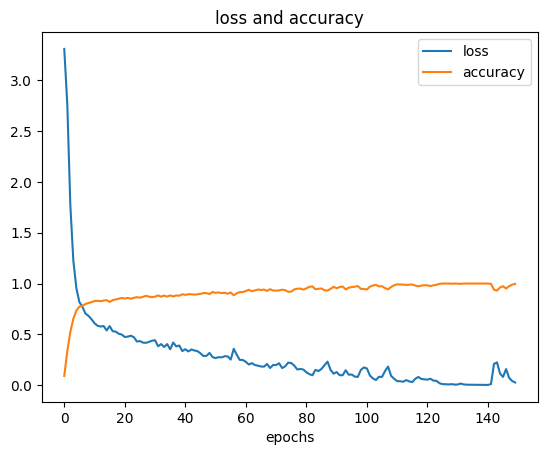

In [100]:
plt.plot(output.history["loss"] , label='loss')
plt.plot(output.history["accuracy"] , label='accuracy')
plt.title('loss and accuracy')
plt.xlabel("epochs")
plt.legend()
plt.show()